In [1]:
import os
import xml.etree.ElementTree as ET
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Input, GaussianNoise
from tensorflow.keras.optimizers import Adam

# Funkcja do parsowania plików XML
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    filename = root.find('filename').text
    size = root.find('size')
    width = int(size.find('width').text)
    height = int(size.find('height').text)
    boxes = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        if name in ['licence', 'LP']:
            xmin = int(obj.find('bndbox').find('xmin').text)
            ymin = int(obj.find('bndbox').find('ymin').text)
            xmax = int(obj.find('bndbox').find('xmax').text)
            ymax = int(obj.find('bndbox').find('ymax').text)
            boxes.append((xmin, ymin, xmax, ymax))
    return filename, width, height, boxes

# Funkcja do ładowania danych
def load_data(directory):
    images = []
    labels = []
    for filename in os.listdir(directory):
        if filename.endswith((".png", ".jpg")):
            image_path = os.path.join(directory, filename)
            xml_path = os.path.join(directory, filename[:-4] + ".xml")
            if os.path.exists(xml_path):
                _, width, height, boxes = parse_xml(xml_path)
                if len(boxes) == 1:
                    images.append(image_path)
                    labels.append(boxes)
    return images, labels


def load_data_check(directory):
    images = []
    for filename in os.listdir(directory):
        if filename.endswith(".png"):
            image_path = os.path.join(directory, filename)
            images.append(image_path)

    return images

# Funkcja do normalizacji danych

def normalize_data(images, labels):
    normalized_labels = []
    data_array = []
    for i in range(len(labels)):
        img = Image.open(images[i]).convert('RGB').resize((224, 224), Image.LANCZOS)
        img_array = np.array(img)
        data_array.append(img_array)
        [(xmin, ymin, xmax, ymax)] = labels[i]
        original_img = Image.open(images[i])
        w, h = original_img.size
        h_scale = h / 224
        w_scale = w / 224
        nxmin, nxmax = int(xmin / w_scale), int(xmax / w_scale)
        nymin, nymax = int(ymin / h_scale), int(ymax / h_scale)
        normalized_labels.append([nxmin, nymin, nxmax, nymax])
    data_array = np.array(data_array).astype('float32') / 255.0
    normalized_labels = np.array(normalized_labels)
    return data_array, normalized_labels

# Funkcja do definiowania modelu
def create_model():
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    for layer in base_model.layers:
        layer.trainable = False
    x = Flatten()(base_model.output)
    x = Dense(1024, activation='relu')(x)
    box_output = Dense(4, activation='linear')(x)
    model = Model(inputs=base_model.input, outputs=box_output)
    return model

# Funkcja do ładowania danych do weryfikacji
def load_data_check(directory):
    images = []
    for filename in os.listdir(directory):
        if filename.endswith(".png"):
            image_path = os.path.join(directory, filename)
            images.append(image_path)
    return images

# Funkcja do obliczania metryki IoU
def iou_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    x1_true, y1_true, x2_true, y2_true = tf.split(y_true, 4, axis=-1)
    x1_pred, y1_pred, x2_pred, y2_pred = tf.split(y_pred, 4, axis=-1)
    x1_inter = tf.maximum(x1_true, x1_pred)
    y1_inter = tf.maximum(y1_true, y1_pred)
    x2_inter = tf.minimum(x2_true, x2_pred)
    y2_inter = tf.minimum(y2_true, y2_pred)
    inter_area = tf.maximum(0.0, x2_inter - x1_inter) * tf.maximum(0.0, y2_inter - y1_inter)
    true_area = (x2_true - x1_true) * (y2_true - y1_true)
    pred_area = (x2_pred - x1_pred) * (y2_pred - y1_pred)
    union_area = true_area + pred_area - inter_area
    iou = inter_area / (union_area + tf.keras.backend.epsilon())
    return tf.reduce_mean(iou)

# Załaduj dane

data_dir = "/Users/kuba/ML_project/cleaned_data2" #tutaj naley podać sciezke do danych
data_images, data_labels = load_data(data_dir)
#data_array, normalized_labels = normalize_data(data_images, data_labels)
data_array, normalized_labels = normalize_data(data_images, data_labels)
data_train, data_val, labels_train, labels_val = train_test_split(data_array, normalized_labels, train_size=0.8, random_state=0)



In [7]:
# Stwórz model
model = create_model()
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=[iou_metric])


In [8]:
# Trenowanie modelu
model.fit(data_train, labels_train, validation_data=(data_val, labels_val), epochs=50, batch_size=32)

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 773ms/step - iou_metric: 0.0467 - loss: 5086.4722 - val_iou_metric: 0.2163 - val_loss: 469.3532
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 747ms/step - iou_metric: 0.2092 - loss: 357.3304 - val_iou_metric: 0.2882 - val_loss: 277.8748
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 747ms/step - iou_metric: 0.3280 - loss: 201.6391 - val_iou_metric: 0.3172 - val_loss: 222.6540
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 763ms/step - iou_metric: 0.3952 - loss: 122.3416 - val_iou_metric: 0.3370 - val_loss: 187.9928
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 776ms/step - iou_metric: 0.4250 - loss: 89.3548 - val_iou_metric: 0.3607 - val_loss: 174.9120
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 782ms/step - iou_metric: 0.4768 - loss: 61.7767 - val_iou_metric: 0.3754 - val_loss: 164.3745
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 786ms/step - iou_metric: 0.5391 - loss: 44.7235 - val_iou_metric: 0.4124 - val_loss: 150.2222
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 23s 7

In [9]:
model.save('/Users/kuba/ML_project/saved_models/object_detection_VGG16.h5')

In [128]:
import numpy as np
from PIL import Image

# Funkcja do normalizacji danych
def normalize_images_check(images):
    data_array = []
    for img_path in images:
        img = Image.open(img_path).convert('RGB').resize((224, 224), Image.LANCZOS)
        img_array = np.array(img)
        data_array.append(img_array)
    data_array = np.array(data_array).astype('float32') / 255.0
    return data_array

# Załaduj dane
check_dir = "/Users/kuba/ML_project/testy"
check_images = load_data_check(check_dir)
check_data_array = normalize_images_check(check_images)


In [129]:
check_data_array = normalize_images_check(check_images)
predictions = model.predict(check_data_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


In [130]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
def draw_image(choose_index):
    check_images = load_data_check(check_dir)
    # Wczytanie obrazu
    image = Image.open(check_images[choose_index])
    # Wybierz indeks obrazu

    # Załadowanie obrazu
    image = Image.open(check_images[choose_index])
    h, w = image.size

    print(f"Original dimensions: height={h}, width={w}")

    # Zakładam, że wartości xmin, xmax, ymin, ymax są zdefiniowane w predictions
    xmin, xmax, ymin, ymax = predictions[choose_index]

    if xmin > xmax:
        xmin, xmax = xmax, xmin
    if ymin > ymax:
        ymin, ymax = ymax, ymin

    # Przeskalowanie współrzędnych do nowego rozmiaru 256x256
    resize_dim = (h, w)
    h_scale = 224 / resize_dim[1]
    w_scale = 224 / resize_dim[0]

    nxmin, nxmax = int(xmin / w_scale), int(xmax / w_scale)
    nymin, nymax = int(ymin / h_scale), int(ymax / h_scale)

    print(f"Original box: {(xmin, xmax, ymin, ymax)}")
    print(f"Rescaled box for original: {(nxmin, nxmax, nymin, nymax)}")

    # Zmiana rozmiaru obrazu
    resized_image = image.resize(resize_dim)
    draw = ImageDraw.Draw(resized_image)
    draw.rectangle([nxmin, nymin, nxmax, nymax], outline=(0, 255, 0), width=3)

    # Wyświetlenie obrazu w zmniejszonym rozmiarze
    plt.figure(figsize=(10, 10))
    plt.imshow(resized_image)
    plt.axis('off')  # Wyłączenie osi
    plt.show()

    # Powrót do oryginalnego rozmiaru i przeskalowanie współrzędnych do oryginalnych wymiarów
    original_h_scale = resize_dim[1] / h
    original_w_scale = resize_dim[0] / w

    oxmin, oxmax = int(nxmin / original_w_scale), int(nxmax / original_w_scale)
    oymin, oymax = int(nymin / original_h_scale), int(nymax / original_h_scale)


Original dimensions: height=1200, width=742
Original box: (93.086685, 170.79628, 142.77884, 190.05646)
Rescaled box for original: (498, 914, 472, 629)


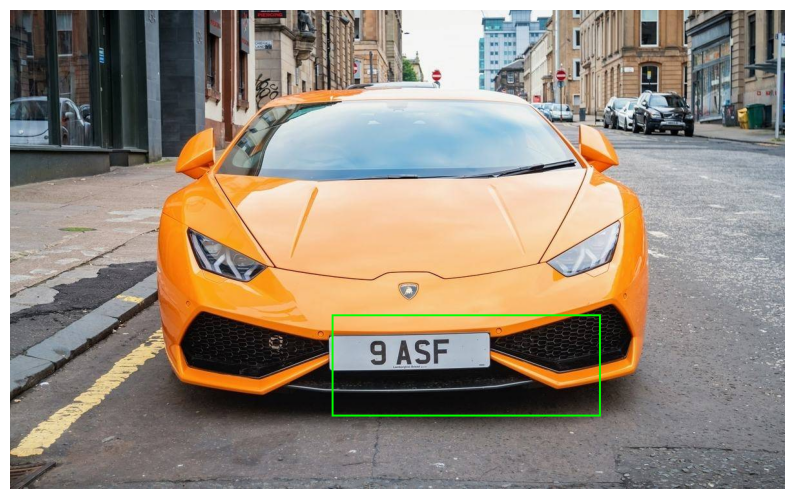

Original dimensions: height=1440, width=1080
Original box: (63.59003, 110.70236, 94.26996, 131.07335)
Rescaled box for original: (408, 711, 454, 631)


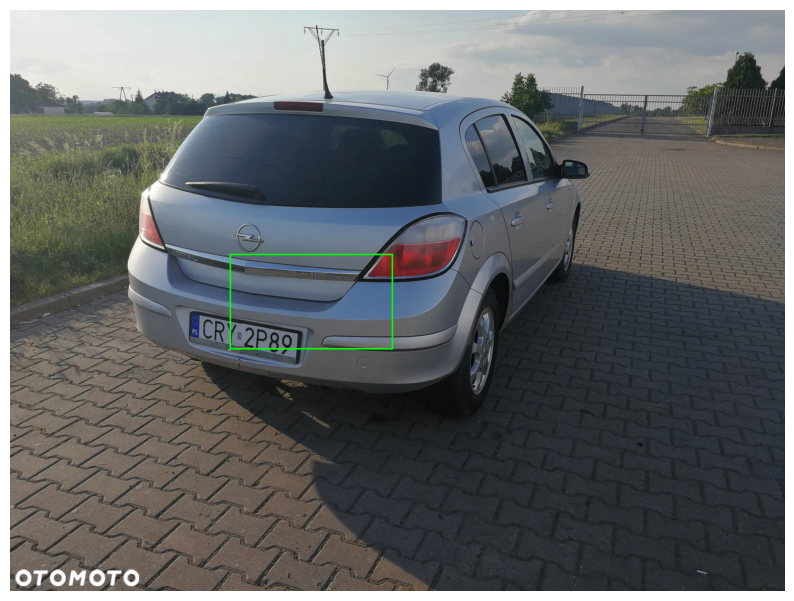

Original dimensions: height=590, width=350
Original box: (84.187706, 107.544754, 127.666405, 134.3872)
Rescaled box for original: (221, 283, 199, 209)


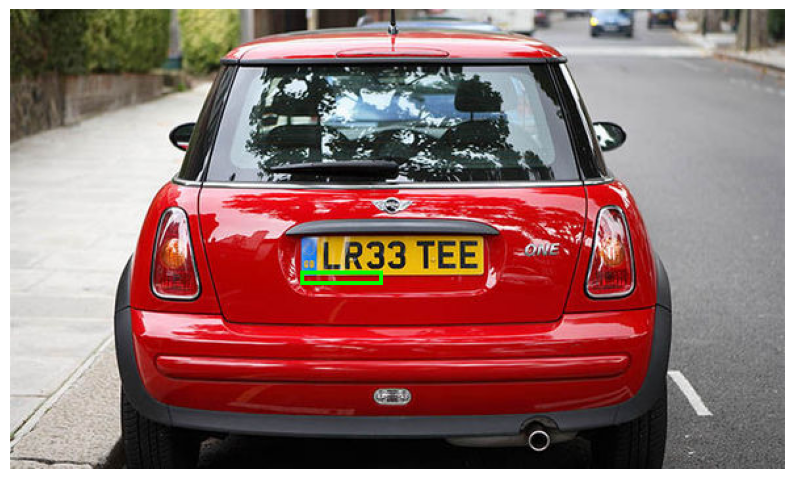

Original dimensions: height=976, width=549
Original box: (90.5684, 141.78767, 165.65985, 174.54924)
Rescaled box for original: (394, 617, 406, 427)


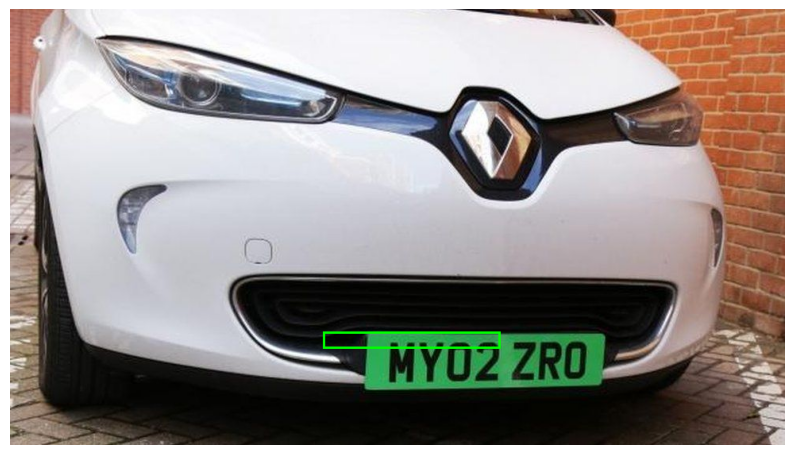

Original dimensions: height=976, width=450
Original box: (93.35593, 164.28908, 117.68225, 174.49902)
Rescaled box for original: (406, 715, 236, 350)


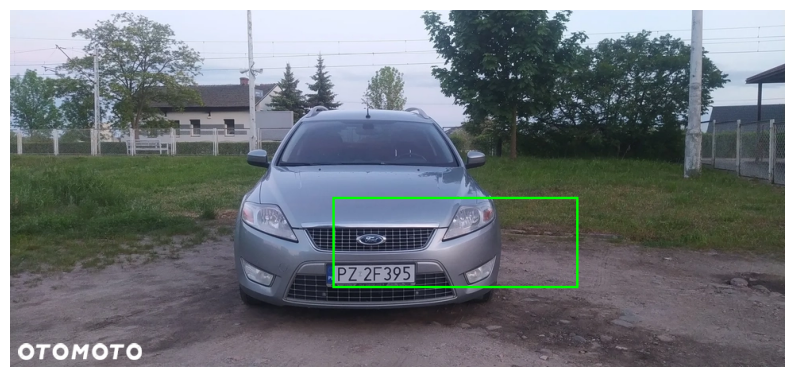

Original dimensions: height=337, width=449
Original box: (51.44099, 145.04576, 109.35167, 165.25911)
Rescaled box for original: (77, 218, 219, 331)


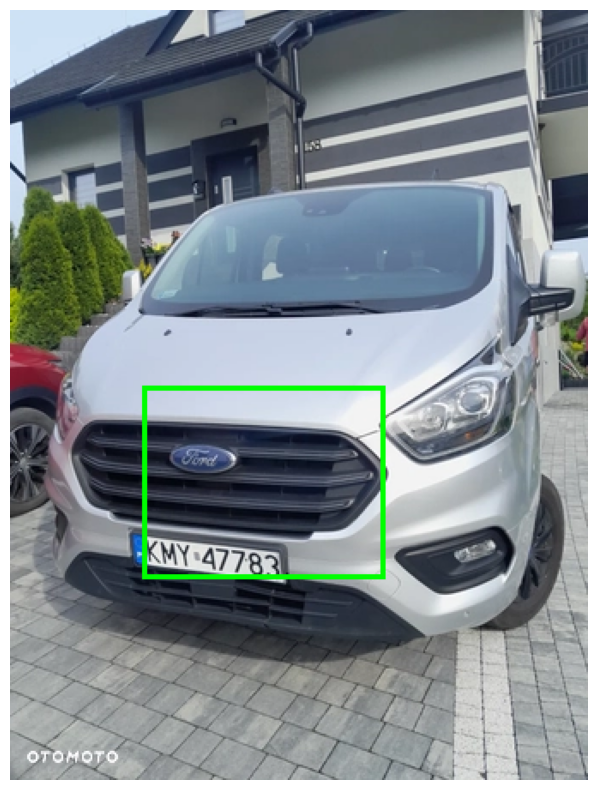

Original dimensions: height=1067, width=800
Original box: (82.30536, 139.42892, 124.82278, 157.69643)
Rescaled box for original: (392, 664, 445, 563)


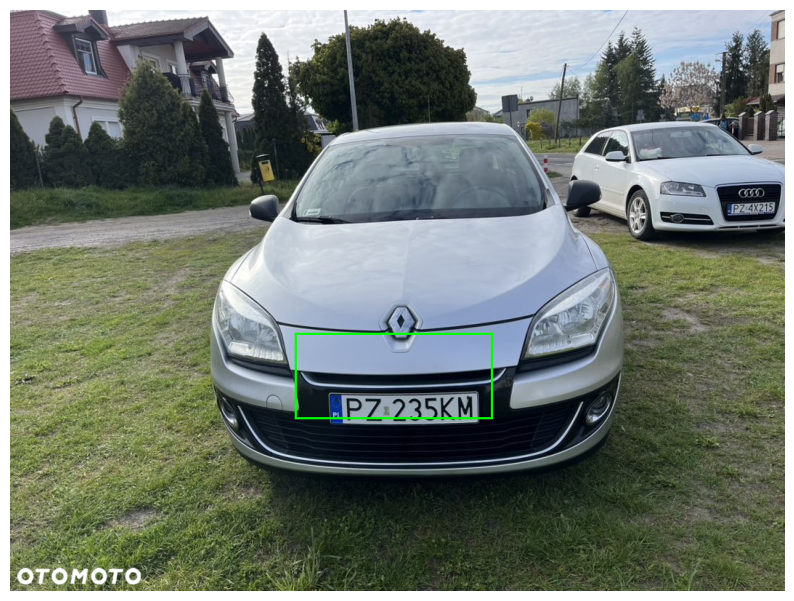

Original dimensions: height=1067, width=800
Original box: (85.212685, 128.69904, 120.480804, 147.59679)
Rescaled box for original: (405, 613, 430, 527)


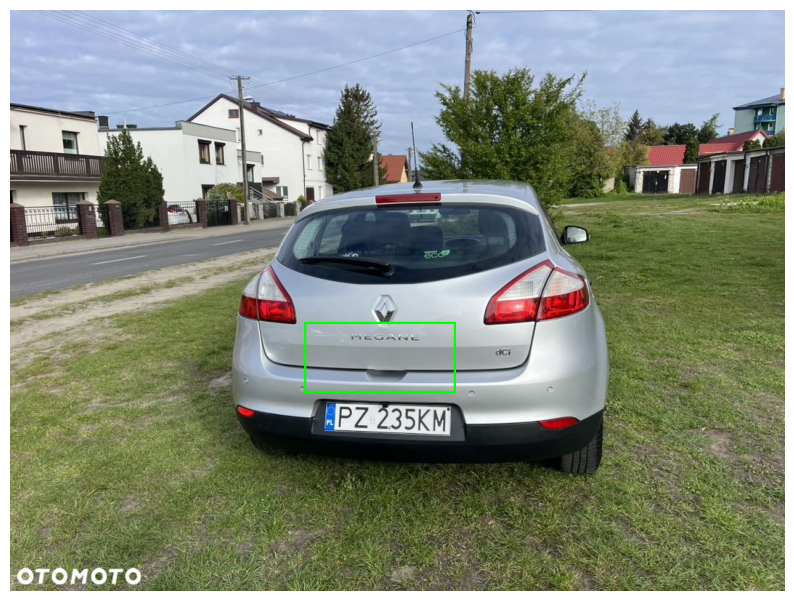

Original dimensions: height=1152, width=2048
Original box: (75.48358, 108.930466, 122.6792, 142.52103)
Rescaled box for original: (388, 560, 1121, 1303)


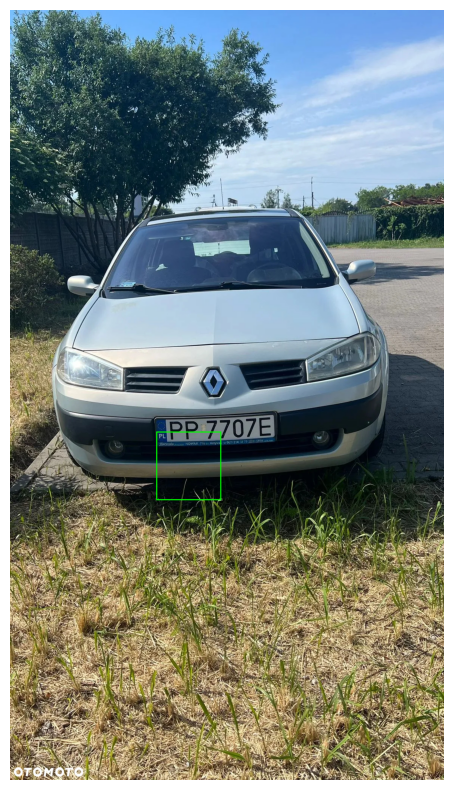

Original dimensions: height=1360, width=2031
Original box: (72.72247, 160.44998, 137.83942, 172.40395)
Rescaled box for original: (441, 974, 1249, 1563)


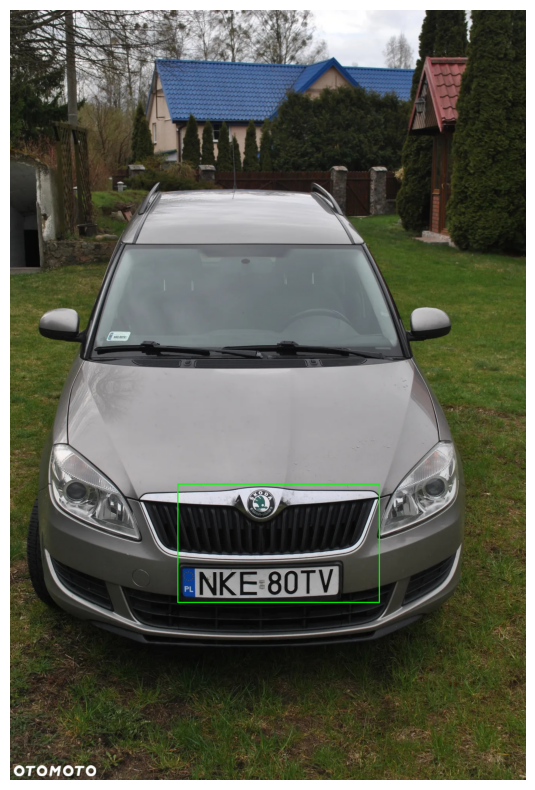

Original dimensions: height=1067, width=800
Original box: (70.871056, 135.98892, 117.22286, 160.30971)
Rescaled box for original: (337, 647, 418, 572)


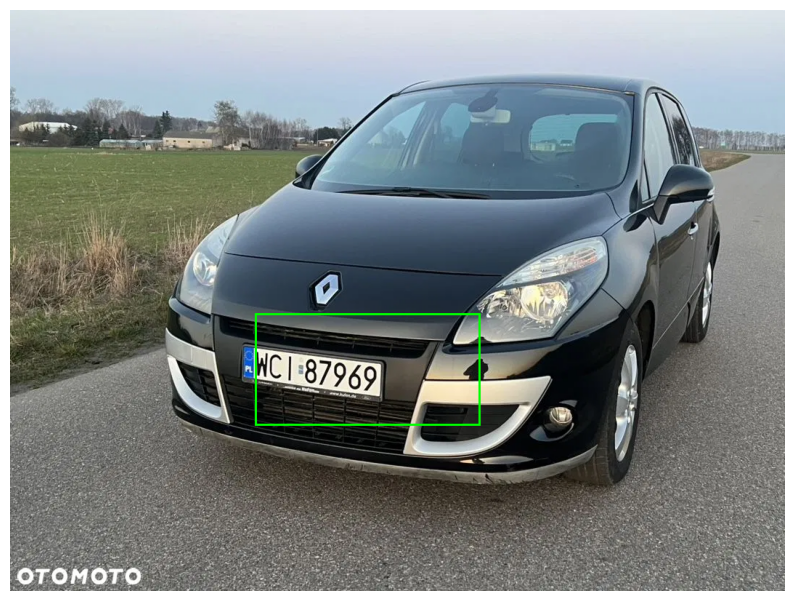

Original dimensions: height=2560, width=1920
Original box: (89.97539, 129.97433, 129.63544, 150.40318)
Rescaled box for original: (1028, 1485, 1111, 1289)


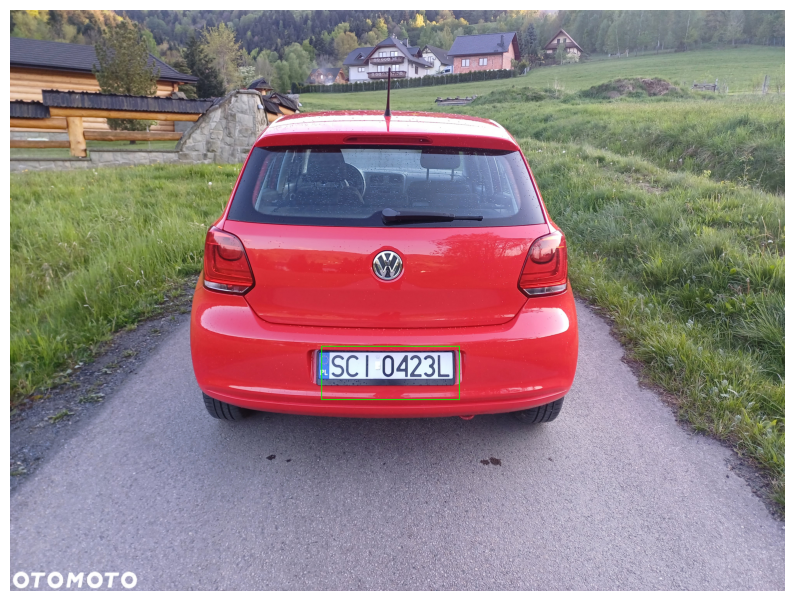

Original dimensions: height=1440, width=648
Original box: (86.88016, 164.60558, 127.08006, 183.81401)
Rescaled box for original: (558, 1058, 367, 531)


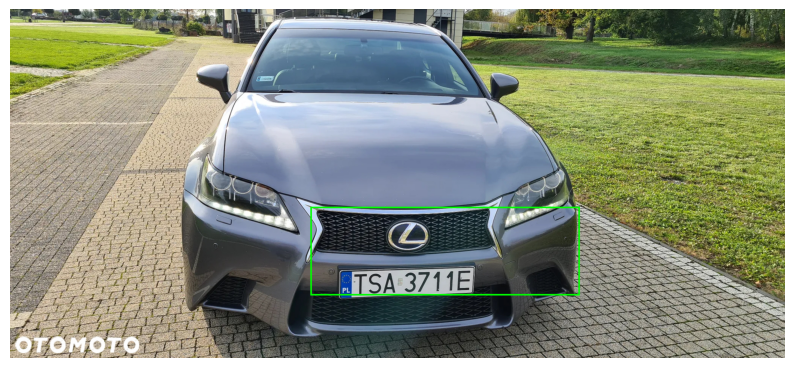

Original dimensions: height=1440, width=648
Original box: (86.15069, 126.702515, 117.80717, 136.88193)
Rescaled box for original: (553, 814, 340, 395)


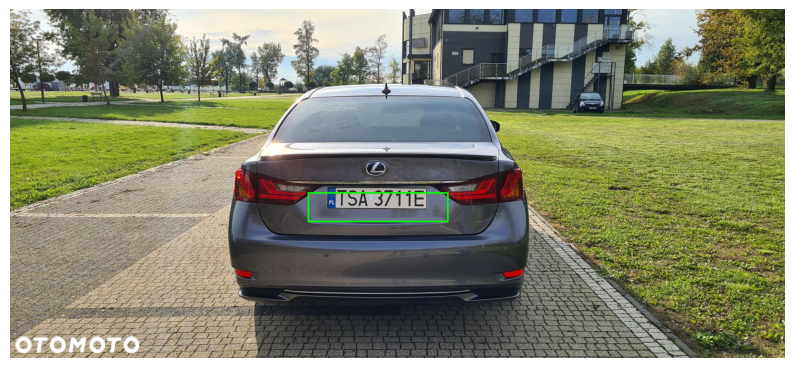

Original dimensions: height=1360, width=1813
Original box: (110.59061, 146.47919, 143.89111, 159.21971)
Rescaled box for original: (671, 889, 1164, 1288)


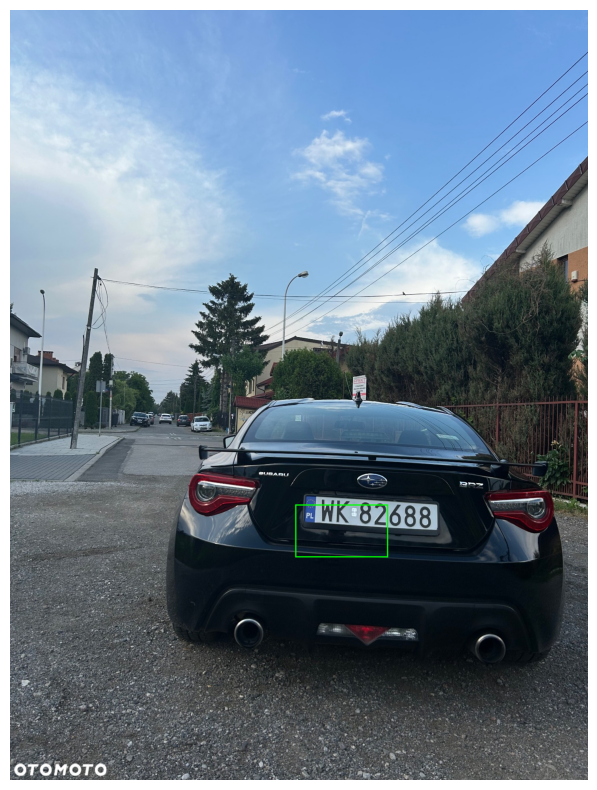

Original dimensions: height=1440, width=962
Original box: (94.96205, 159.44362, 145.59752, 182.72186)
Rescaled box for original: (610, 1024, 625, 784)


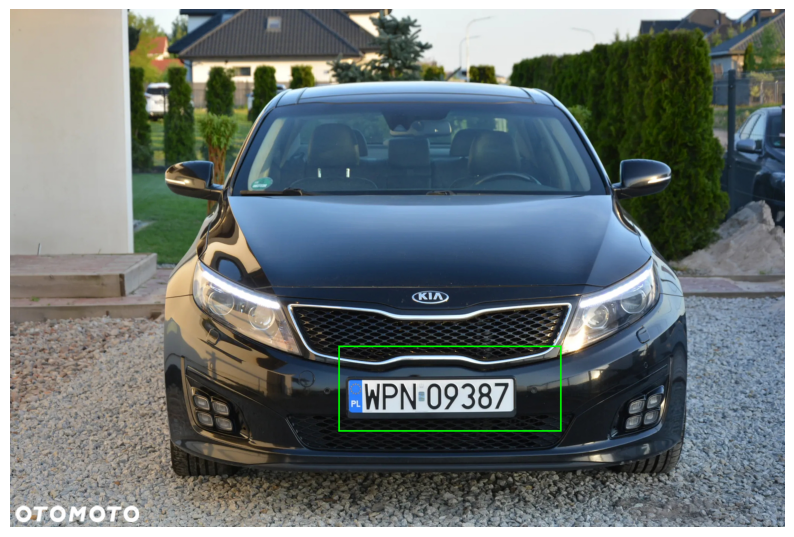

Original dimensions: height=1440, width=962
Original box: (27.054281, 131.13629, 63.368774, 152.76639)
Rescaled box for original: (173, 843, 272, 656)


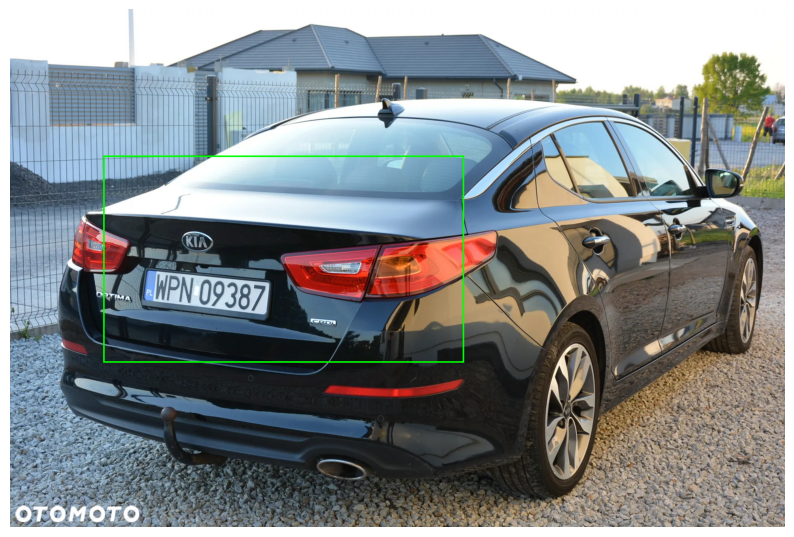

In [131]:
for i in range(len(check_images)):
    draw_image(i)

Mozliwość wczytania modelu 

In [ ]:
from tensorflow.keras.models import load_model

# Wczytaj model
model_path = '/Users/kuba/ML_project/saved_models/object_detection_model_v1.h5'
model = load_model(model_path, custom_objects={'iou_metric': iou_metric})